# __Road Traffic Fine Management Process Case Study__

This notebook contains the __extensive case study on the dynamics over time in the Road Traffic Fine Management Process event log__. The Road Traffic Fine Management Process Event Log (de Leoni & Mannhardt, 2015) is a real-life event log of an information system managing road traffic fines. It covers data from 2000-01-01 to 2013-06-18. It contains 150,370 cases and 561,470 events in total. The Road Traffic Fine Management Process event log can be downloaded [here](https://data.4tu.nl/articles/dataset/Road_Traffic_Fine_Management_Process/12683249). 

This notebook consists of __5 sections__, with each section corresponding to a certain event log conceptualization, for which it contains the most interesting identified trends, patterns or changes over time. In each section, the visualizations are accompanied with markdown cells discussing these distinctive dynamics over time. 

0. [__General Remarks and Observations__](#0-general-observations-and-remarks)
1. [__Variants__](#1-variants): The dynamics observed for the variants indicate significant and recurring changes in the control-flow perspective. 
1. [__Directly-Follows-Relations__](#2-directly-follows-relations-dfrs): The dynamics observed for the DFRs also indicate significant and recurring changes in the control-flow perspective.
1. [__Categorical Event Features__](#4-categorical-event-features): Interesting patterns and changes were observed for multiple categorical event features, including 'org:resource' _(resource perspective)_, 'Selected' & 'Accepted' _(both data perspective)_, and in 'concept:name', which contains the activity labels of the events _(control-flow perspective)_. 
1. [__Numerical Event Features__](#5-numerical-event-features): Only one numeric event feature is contained within the Road Traffic Fine Management Process event log. Apart from outliers at the beginning and the end of the dataset, no prominant changes were detected. 

The Road Traffic Fine Management Process event log contains no categorical case features except 'case:concept:name'.

The Road Traffic Fine Management Process event log contains no numerical case features.

Importing pandas and the __DyLoPro__ library. 

In [1]:
import pandas as pd
import DyLoPro as dlp

Reading in the event log and converting some columns to the required dtype. 

In [2]:
event_log = pd.read_csv('Traffic.csv',header=0)
case_id_key='case:concept:name'
activity_key='concept:name'
timestamp_key='time:timestamp'
event_log['org:resource'] = event_log['org:resource'].astype(str)
event_log['article'] = event_log['article'].astype(str)

Specifying the available features.

In [3]:
categorical_casefeatures = []
numerical_eventfeatures = ['amount', 'totalPaymentAmount', 'points', 'expense', 'paymentAmount']
categorical_eventfeatures = ['dismissal', 'lifecycle:transition','vehicleClass', 'concept:name','org:resource','article']
numerical_casefeatures = []
start_date=None
end_date=None
outcome=None

In [4]:
event_log['time:timestamp'] = pd.to_datetime(event_log['time:timestamp'], format = 'mixed').dt.tz_convert('UTC')

In [5]:
traffic_plots = dlp.DynamicLogPlots(event_log, 
                                  case_id_key, 
                                  activity_key, 
                                  timestamp_key,
                                  categorical_eventfeatures= categorical_eventfeatures, 
                                  numerical_eventfeatures = numerical_eventfeatures, 
                                  numerical_casefeatures = numerical_casefeatures, 
                                  categorical_casefeatures=categorical_casefeatures,
                                  start_date =start_date , 
                                  end_date = end_date, 
                                  outcome= outcome)

Preprocessing the data...


100%|██████████| 561470/561470 [00:00<00:00, 2010608.84it/s]


All of DyLoPro's plotting methods construct time series by deriving real-valued measures for a choronologically ordered set of sublogs. This chronologically ordered set of sublogs is constructed by:

1. Defining the `frequency` parameter, that determines the frequency by which the observations are grouped. E.g. here, for all visualizations, we use the default `frequency='weekly'`. As such, the time period covered by the entire event log is subdivided into a chronologically ordered set of weekly time intervals.

2. Defining the `case_assignment` parameter, that determines the condition upon which each case is assigned to one of these equal-length time intervals. E.g. here, for all visualizations, we use the default `case_assignment='first_event'`. As such, each case is assigned to the time interval in which its first event occurs.

Consequently, for the Road Traffic Fine Management Process case study with `frequency='weekly'` and `case_assignment='first_event'`, each case is assigned to the 1-week time interval in which its first event occurs and hence each sublog will consist of all cases that were initialized in one particular week.

**NOTE:** For the Road Traffic Fine Management Process plots, we use the default settings for the following common parameters unless specified otherwise:

  •	time_unit = 'days'

  •	frequency = 'quarterly'

  •	case_assignment = 'first_event'

  •	max_k = 10

  •	xtr_outlier_rem = True

## **0. General observations and remarks:**

1. Every plotting method also provides a first global overview of the amount of cases contained within each interval, and: 
    - If __representation type = Throughput Time (TT)__ (`plt_type='type_tt'`): the overal throughput time aggregated over all cases contained within each time interval / sublog. _(The aggregation operator is by default the mean, and can be customized by specifying the `numeric_agg` parameter of each plotting method.)_
    - If __representation type = Case Length (Number of Events per Case, aka NEPC)__ (`plt_type='type_events_case'`): the overal case length (in NEPC) aggregated over all cases contained within each time interval / sublog. _(The aggregation operator is by default the mean, and can be customized by specifying the `numeric_agg` parameter of each plotting method.)_
    - If __representation type = Outcome__ (`plt_type='type_outcome'`): the overal fraction of positive cases contained within each time interval / sublog. _(No binary outcome feature is included in the BPIC19.)_
1. The default representation type of each plotting method is Isolated, but since each non-default representation type also includes the isolated time series, we only use the non-default representation tpyes.     

1. The Road Traffic Fine Management Process event log contains cases from 2000-01-01 to 2013-06-18. Consequently, if we assume that only completed cases are extracted that roughly started after 2018-01-01 and ended before a certain extraction date, both the **beginning** and **ending** of the event log contain some **bias**:
    - **Bias** in **beginning** event log - By only including the cases that start after a certain point in time, the number of running cases in the beginning of the event log does not reflect the underlying actual reality. How long this bias is persisted in the plots depends on both the chosen __`frequency`__ (= `'quarterly'` in the Road Traffic Fine Management Process case study) and the distribution of the __throughput time__ of cases. 
    - **Bias** in **ending** of the event log - By only including the **completed** cases that end (and hence are completed) before a certain point in time:
        1. The number of running cases towards the end of the event log does not reflect the underlying actual reality. Again, the amount of subsequent time intervals located near the end of the event log in which this bias is included, depends on both the chosen __`frequency`__ (= `'quarterly'` in the Road Traffic Fine Management Process case study) and the distribution of the __throughput time__ of cases.
        1. The average throughput time (TT) of cases towards the end of the dataset is lower than the actual reality. Among cases starting near the ending, cases with a higher TT will be more likely to end after the extraction date and will hence not be included in the event log. The amount of time intervals near the end in which this bias is persisted will again also depend on the chosen __`frequency`__ (= `'quarterly'` in the Road Traffic Fine Management Process case study) and the distribution of the __throughput time__ of cases.

    Intervals near the beginning and end of the event log in which the number of cases is significantly smaller compared to other time intervals, might give us non-representative samples of cases, and hence yield unrepresentative aggregations. Every plotting method also provides a first global overview of the amount of cases contained within each interval. As such, unrepresentative samples near the beginning or end of the event log can easily be identified. Therefore, we will not report on deviating measurements if they pertain to such non-representative samples. 

## __1. Variants__
We investigate the dynamics over time for the top 10 most frequently occurring variants. The following interesting trends, patterns and changes were identified: 
1. Significant and sudden concept drift in the control-flow perspective around 2018-09:
    - __Variant 1__ variant 1 delivered around 40% of the cases before 2012. Around 2012 it incurred a sudden and steep decline converging to 0 towards the end.
    - __Variant 2 and 3__ on the other hand incurred a sudden and steep incline around 2012.
    When looking at their corresponding activity sequences, we can easily find that variant 1 contains 5 activities (Create Fine, Send Fine, Insert Fine Notification, Add penalty, Send for Credit Collection) while both variant 2 and 3 contains only 2 activities(Create Fine, Payment; Create Fine, Send Fine). The TT of variant 2 and 3 are significantly lower than variant 1.
2. A recurring pattern of the number of cases contained and the average TT of cases:
    - This recurring pattern is due to the fact that the event log covers a time period of more than 13 years, while the average TT of cases is about 1 year. The huge discrepancy between the duration of the whole time period and the average TT of cases explains the annually recurring drifts
3. Interesting throughput time patterns for some variants: 
    - __variants 6__ incurred a sudden and steep decline after 2006.
    - __variants 7__ incurred a sudden and steep decline after 2002.
    - ...

Retrieving the dataframe containing the activity sequences (and counts) of the top 10 most frequently occurring variants.

In [11]:
var_df = traffic_plots.get_var_df(max_k = 10, counts = True)
print(var_df.to_string())

                                                                                                                                     variant  variant count
variant number                                                                                                                                             
1                                                (Create Fine, Send Fine, Insert Fine Notification, Add penalty, Send for Credit Collection)          56482
2                                                                                                                     (Create Fine, Payment)          46371
3                                                                                                                   (Create Fine, Send Fine)          20385
4                                                                   (Create Fine, Send Fine, Insert Fine Notification, Add penalty, Payment)           9520
5                                                          (Crea

Computing additional quarterly Throughput Time aggregations for each of the 10 most frequently occurring variants: 100%|██████████| 10/10 [00:00<00:00, 16.51it/s]


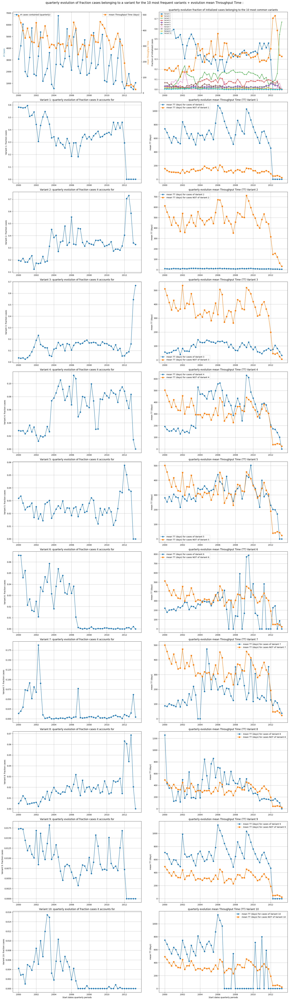

In [10]:
traffic_plots.topK_variants_evol(max_k = 10, frequency='quarterly', plt_type = 'type_tt', xtr_outlier_rem = False)

## __2. Directly-Follows-Relations (DFRs)__
We investigate the dynamics over time for the top 10 most frequently occurring DFRs. The following interesting trends, patterns and changes were identified: 
1. __DFRs 1 and 2 and 3 and 4__: 
    1. A similar recurring pattern can be observed in the graph of their quarterly evolution mean TT for cases. The quarterly evolution mean TT for cases with them fluctuates between 400 days and 1000 days. The quarterly evolution mean TT for cases without them in general evolves in a quite short period of time, some are even close to 0.
    1. The quarterly evolution mean TT for cases with these DFRs all shows a similar sudden and steep decline converging to 0 towards the end.
    1. The fraction of cases with at least one DFR 1 and 2 and 3 and 4 in general displays similar remarkable patterns. However A notable difference is that the fraction of cases with at least one DFR 1 incurred a sudden and steep incline after the sudden and steep decline observed in the graphs of other DFRs.
    1. If we look at the mean case length (NEPC) cases with at least one occurrence of DFRs 1 and 2 and 3 and 4, we observe that the NEPC with at least one occurrence of DFRs 1 and 2 and 3 and 4 evovles around 4 and 5, however the NEPC without at least one occurrence of DFRs 1 and 2 and 3 and 4 evolves around 2 and 3.
1. __DFRs 5__: 
    1. The quarterly evolution mean TT for cases with DFR 5 is extremely low comparing to others, if we look at the activities of DFRs 5, we can find that DFRs 5 contains two activities (Create Fine, Payment), they are exactly the complete activities of variant 2. The low mean TT of variant 2 explains why the quarterly evolution mean TT for cases with DFRs 5 are so low.
    1. If we look at the mean case length (NEPC) cases with at least one occurrence of DFRs 5, we observe that the NEPC with at least one occurrence of DFRs 5 evovles around 2. Thus again indicates that cases with at least one occureence of DFRs 5 are mainly pertain to variant 2.
1. [Quarterly evolution mean DFR performance](#23-representation-type--dfr-performance): 
    1. The quarterly evolution mean DFR performance of DFR 4 is extremely high comparing to others, it evolves between 400 days and over 800 days. It incurred a sudden and steep decline converging to 0 towards the end around 2012.
    2. The quarterly evolution mean DFR performance of DFR 3 is stable. It remains unchanged in the level of 60 days at all time except for incurring a sudden and steep decline converging to 0 towards the end around 2012.

Retrieving the dataframe containing the activity pairs (and counts) of the top 10 most frequently occurring DFRs.

In [17]:
dfr_df = traffic_plots.get_DFR_df(max_k = 10, counts = True)
print(dfr_df.to_string())

                                                                     DFR  DFR count
DFR number                                                                         
1                                               (Create Fine, Send Fine)     103392
2                                  (Send Fine, Insert Fine Notification)      79757
3                                (Insert Fine Notification, Add penalty)      72334
4                              (Add penalty, Send for Credit Collection)      57182
5                                                 (Create Fine, Payment)      46952
6                                                 (Add penalty, Payment)      18621
7                                                     (Payment, Payment)       4306
8                                                 (Payment, Add penalty)       3902
9                                    (Insert Fine Notification, Payment)       3891
10          (Insert Fine Notification, Insert Date Appeal to Prefecture)    

#### 2.1 Representation type : __Throughput Time (TT)__ 

Computing additional quarterly Throughput Time aggregations for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 11.98it/s]


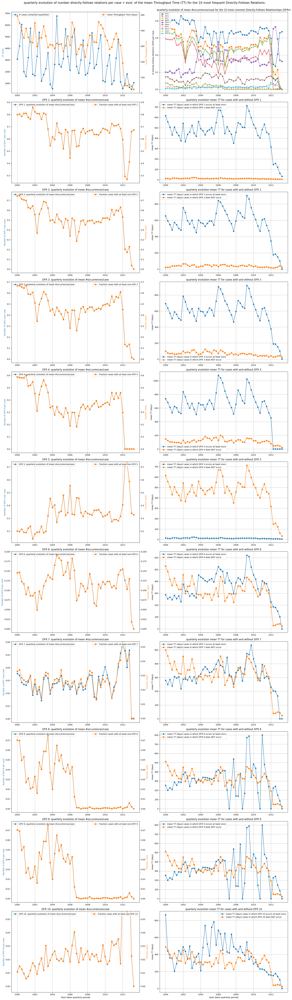

In [24]:
traffic_plots.topK_dfr_evol(frequency='quarterly', plt_type = 'type_tt')

#### 2.2 Representation type : __Case Length (NEPC)__ 

Computing additional quarterly aggregations of the amount of events per case for each of the 10 most frequently occurring DFRs: 100%|██████████| 10/10 [00:00<00:00, 11.34it/s]


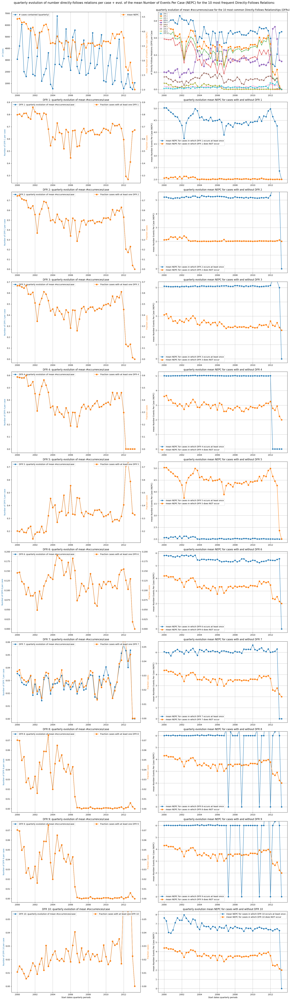

In [22]:
traffic_plots.topK_dfr_evol(frequency='quarterly',plt_type = 'type_events_case')

#### 2.3 Representation type : __DFR Performance__ 

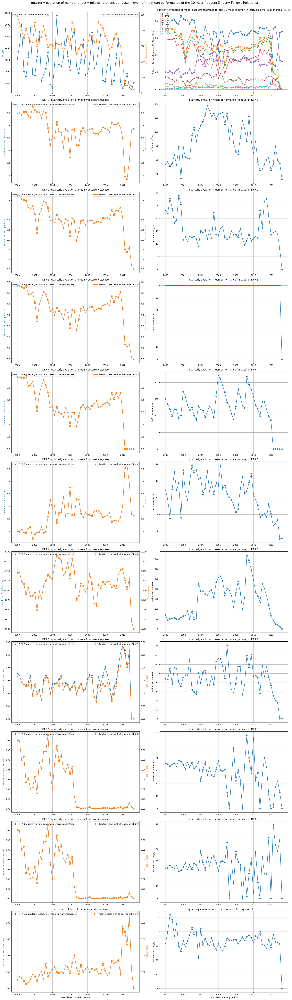

In [23]:
traffic_plots.topK_dfr_evol(frequency='quarterly', plt_type = 'type_dfr_performance', xtr_outlier_rem = False)

## __3. Categorical Event Features__ 

### __3.1 Categorical Event Feature: 'org:resource'__
**'org:resource'** refers to the column containing information about the resource that executes a certain event. In this subsection, we investigate the dynamics for the 10 most frequently occurring resources over time. 

Overall, not that many interesting trends and patterns can be observed. Therefore, we do not elaborate further on this. 

#### __3.1.1 'org:resource'__ - Representation type: __Throughput Time (TT)__

Computing the quarterly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'org:resource': 100%|██████████| 10/10 [00:00<00:00, 12.07it/s]


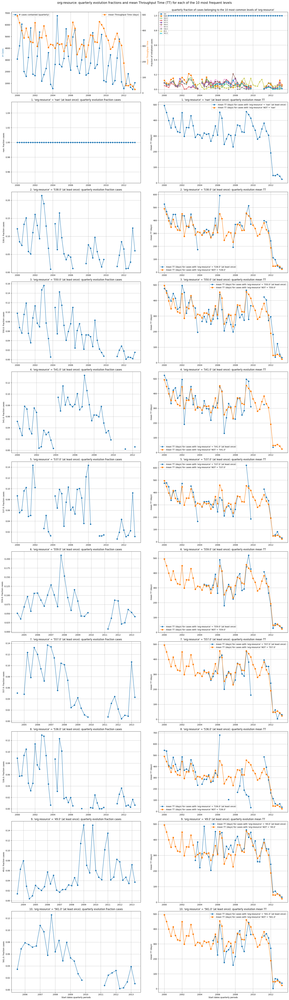

In [6]:
traffic_plots.topK_categorical_eventftr_evol(frequency='quarterly', event_feature='org:resource', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.1.2 'org:resource'__ - Representation type: __Case Length (NEPC)__

Computing the quarterly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'org:resource': 100%|██████████| 10/10 [00:00<00:00, 12.53it/s]


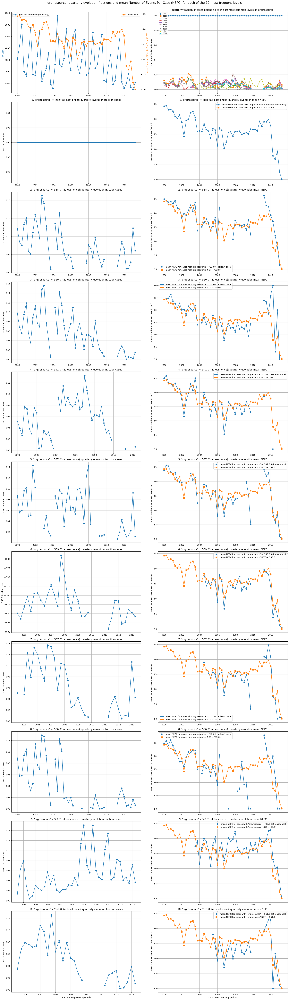

In [9]:
traffic_plots.topK_categorical_eventftr_evol(event_feature='org:resource', frequency= 'quarterly', plt_type = 'type_events_case', xtr_outlier_rem = False)

### __4.2 Categorical Event Feature: 'concept:name'__
**'concept:name'** refers to the column containing the __activity labels__ of each event. The Road Traffic Management Process event log contains 10 distinct activities. In this subsection, we investigate the dynamics for the 10 most frequently occurring activities over time. 

Overall, the presence or absence of certain activites in a case often seems to have significant implications for the [mean throughput time (TT)](#421-conceptname---representation-type-throughput-time-tt) as well as the [mean case length (NEPC)](#322-conceptname---representation-type-case-length-nepc). Underneath, we briefly elaborate on some of the most prominent patterns, changes and trends: 

1. The **1st** most occurring activity __'Create Fine'__: appears once in every single case. 
1. The **5th** most occurring activity __'Payment'__: 
    - The quarterly evolution mean TT of it fluctuates under 200 days, which is quite low comparing to others.
    - The quarterly evolution mean NEPC of it is also lower than others.
1. A recurring drift occurs quite often as well as a sudden and steep decline towards the end around 2012.

#### __4.2.1 'concept:name'__ - Representation type: __Throughput Time (TT)__

Computing the quarterly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'concept:name': 100%|██████████| 10/10 [00:00<00:00, 11.99it/s]


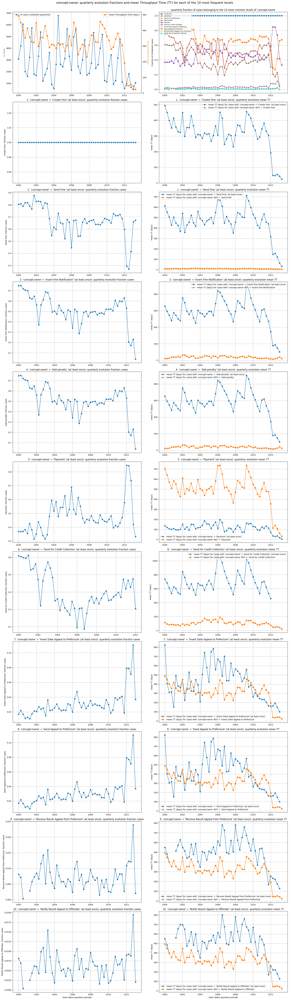

In [26]:
traffic_plots.topK_categorical_eventftr_evol(frequency='quarterly', event_feature='concept:name', plt_type = 'type_tt', xtr_outlier_rem = False)

#### __3.2.2 'concept:name'__ - Representation type: __Case Length (NEPC)__

Computing the quarterly aggregations for each of the 10 most frequently occurring levels of categorical event feature 'concept:name': 100%|██████████| 10/10 [00:00<00:00, 12.92it/s]


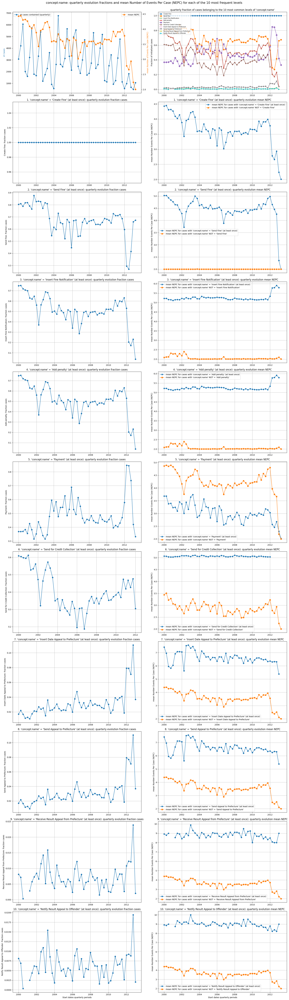

In [9]:
traffic_plots.topK_categorical_eventftr_evol(frequency='quarterly', event_feature='concept:name', plt_type = 'type_events_case', xtr_outlier_rem = False)

## __4. Numerical Event Features__ 
The BPIC19 event log contains 5 numeric event feature, namely 'amount', 'totalPaymentAmount', 'points', 'expense', 'paymentAmount'.

Overall, not that many interesting trends and patterns can be observed. Therefore, we do not elaborate further on this. 


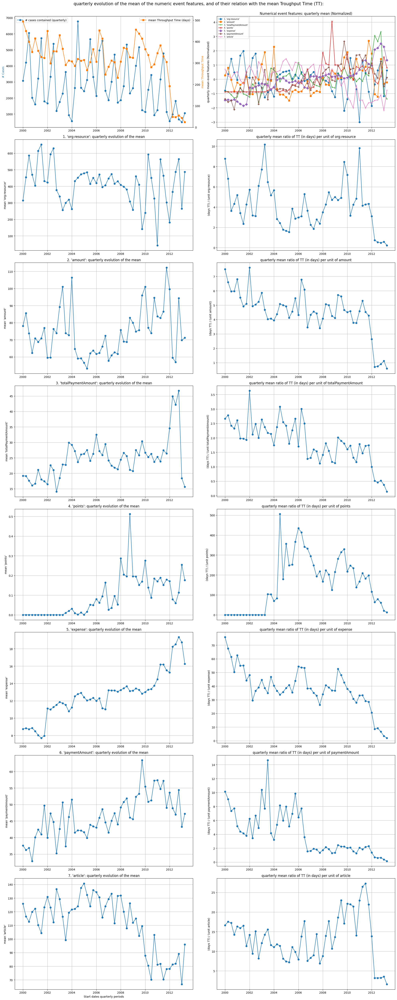

In [27]:
traffic_plots.num_eventfts_evol(frequency='quarterly', numeric_event_list= numerical_eventfeatures, plt_type = 'type_tt', 
                               numEventFt_transform='last', xtr_outlier_rem = False)

### __4.2 Numerical Event Features__ - Representation type: __Case Length (NEPC)__

Computing the additional quarterly NEPC aggregations for each of the 5 given numerical event features: 100%|██████████| 5/5 [00:00<00:00,  8.33it/s]


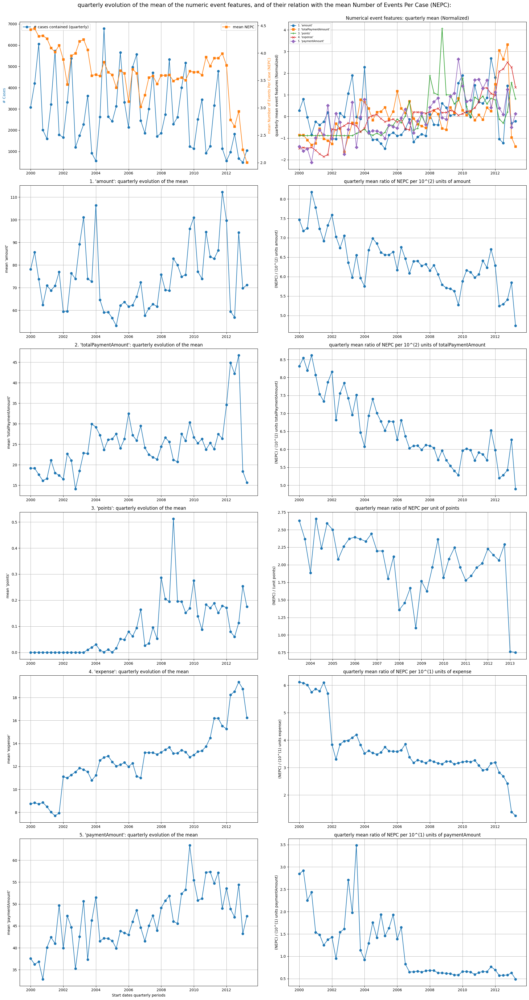

In [10]:
traffic_plots.num_eventfts_evol(numeric_event_list= numerical_eventfeatures,frequency='quarterly', plt_type = 'type_events_case', numEventFt_transform='last', xtr_outlier_rem=False)